In [1]:
%matplotlib inline
import os
import sys
sys.path.append('path_to_plantcv')
# Modify plantcv_directory to the directory where PlantCV is installed (e.g. /home/jdoe/plantcv/)
import numpy as np
import cv2
from matplotlib import pyplot as plt
import matplotlib
import plantcv as pcv
from plantcv import print_image
from plantcv import plot_image
from plantcv.dev.color_palette import color_palette
matplotlib.rcParams['figure.figsize'] = (10,10)
# (10,10) in the line above controls displayed image resolution. Bigger images better display squares drawn in several steps below.

/Users/mgehan/anaconda2/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
# Set variables
device = 0
debug = 'plot'
vis_img = './octagon_20170830.0955_quinoa_qq74.jpg'
# Modify image_file to the directory and file for an image to be processed (e.g. /home/jdoe/octagon_images/sideview1_image1.jpg)

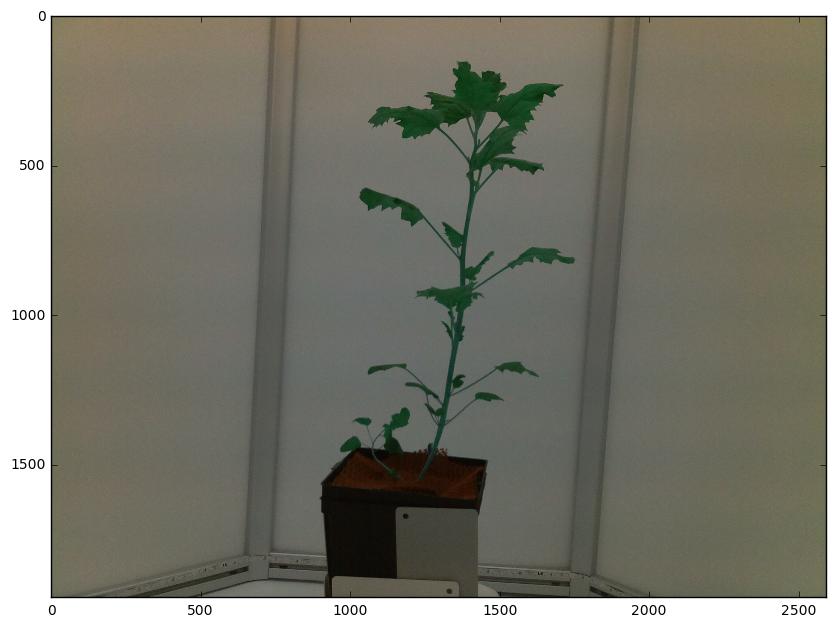

In [3]:
# Read VIS image
img, path, filename = pcv.readimage(vis_img)
plt.imshow(img)
plt.show()

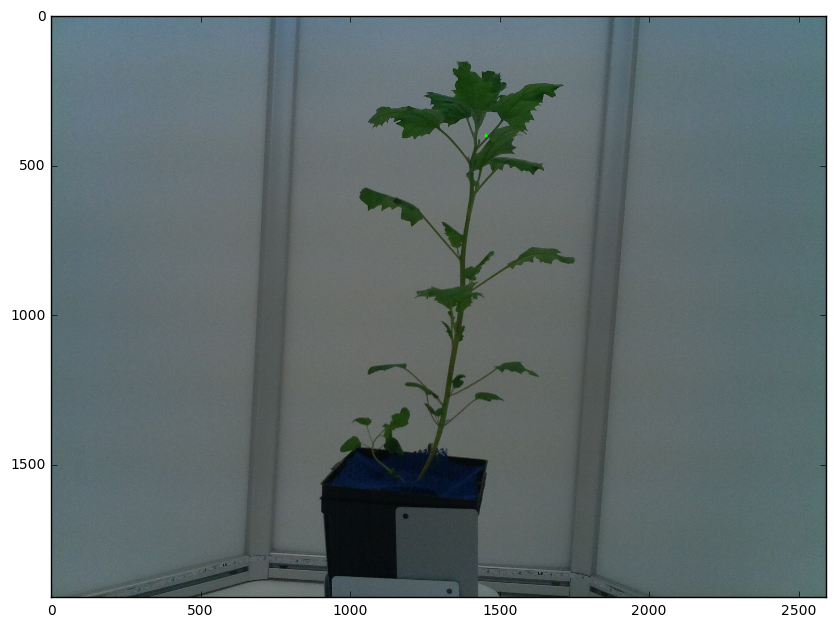

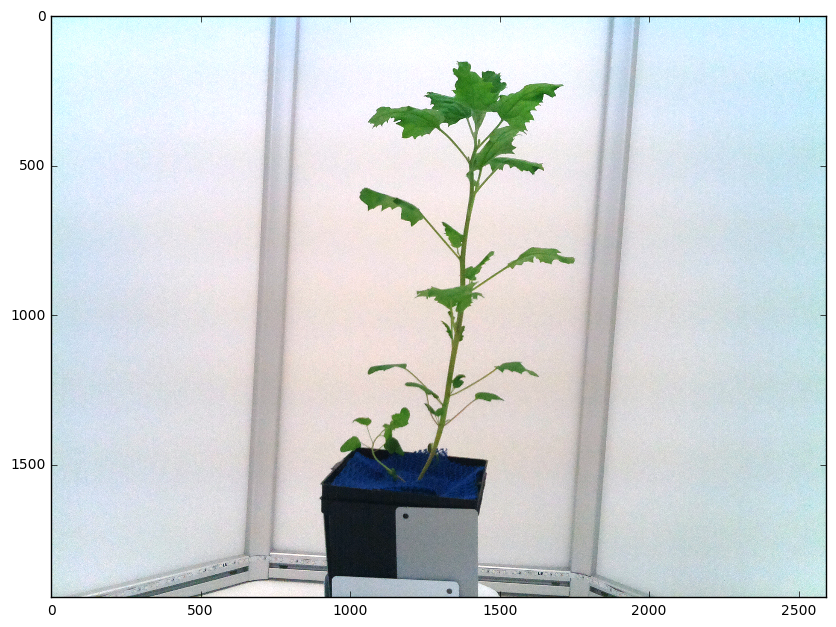

In [4]:
# White balances image
device, corr_img = pcv.white_balance(device, img, debug, [1450, 400, 5, 5])
# Modify the 4 coordinates in parenthesis to frame a white part of the image

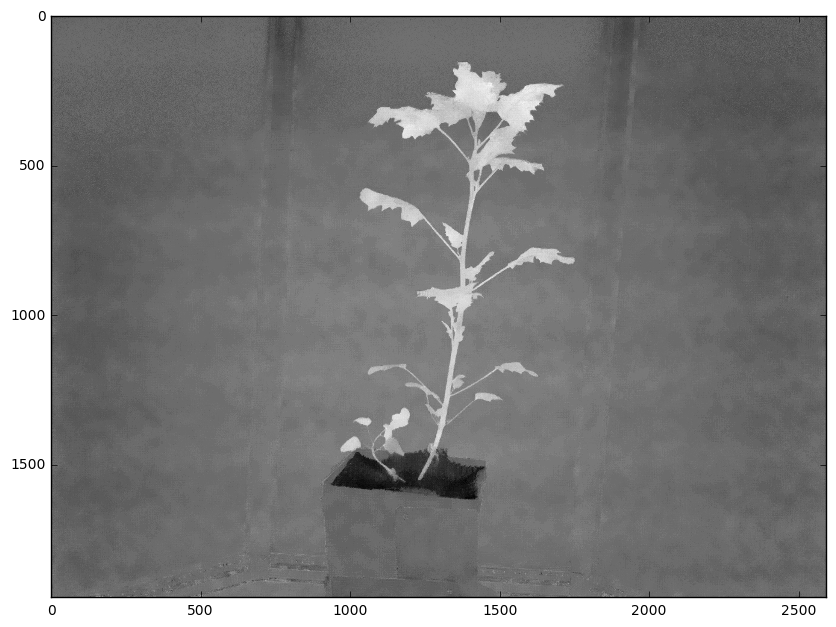

In [5]:
# Convert RBG to Grey using Blue-Yellow Channel 
device, b = pcv.rgb2gray_lab(corr_img, 'b', device, debug)
# Channel 'b' should make the plant brighter over background. Otherwise, use channel 'l' or 'a'. 

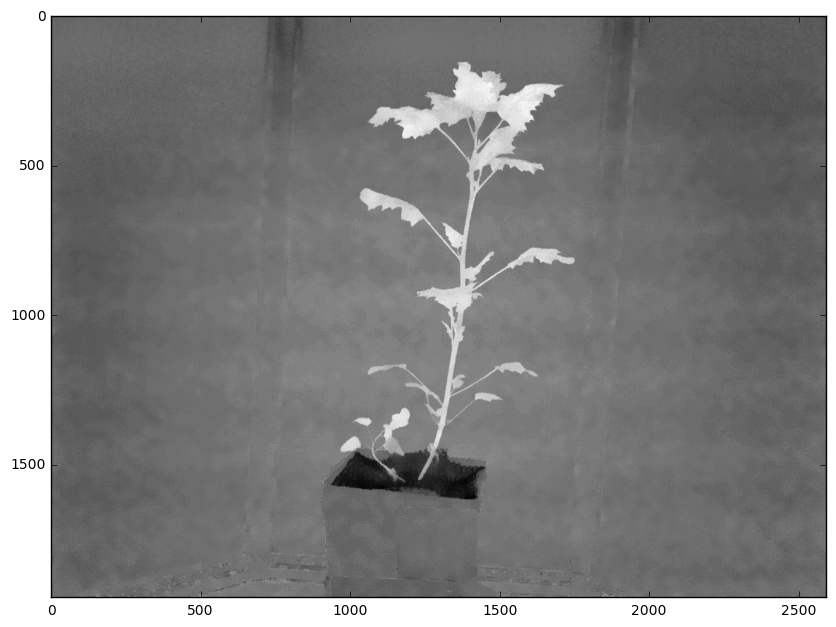

In [6]:
# Gaussian blur
device, g_blur = pcv.gaussian_blur(device, b, (5,5), 0, None, debug)

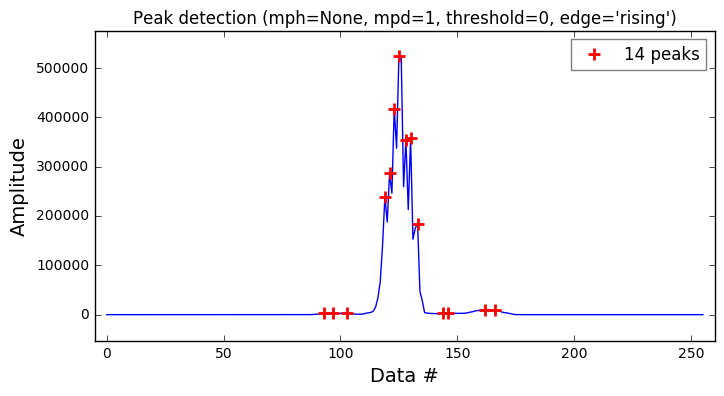

/Users/mgehan/anaconda2/lib/python2.7/site-packages/matplotlib/__init__.py:1357: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Threshold value = 145


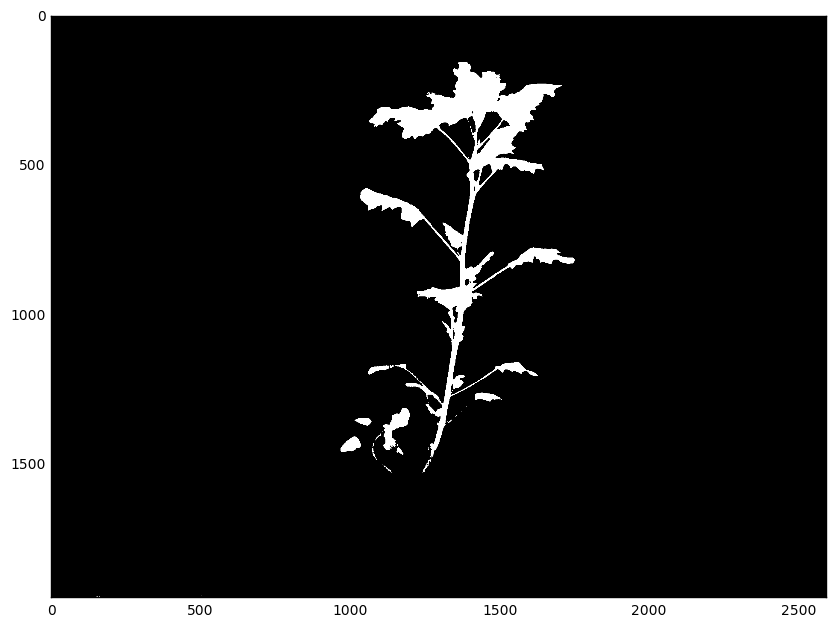

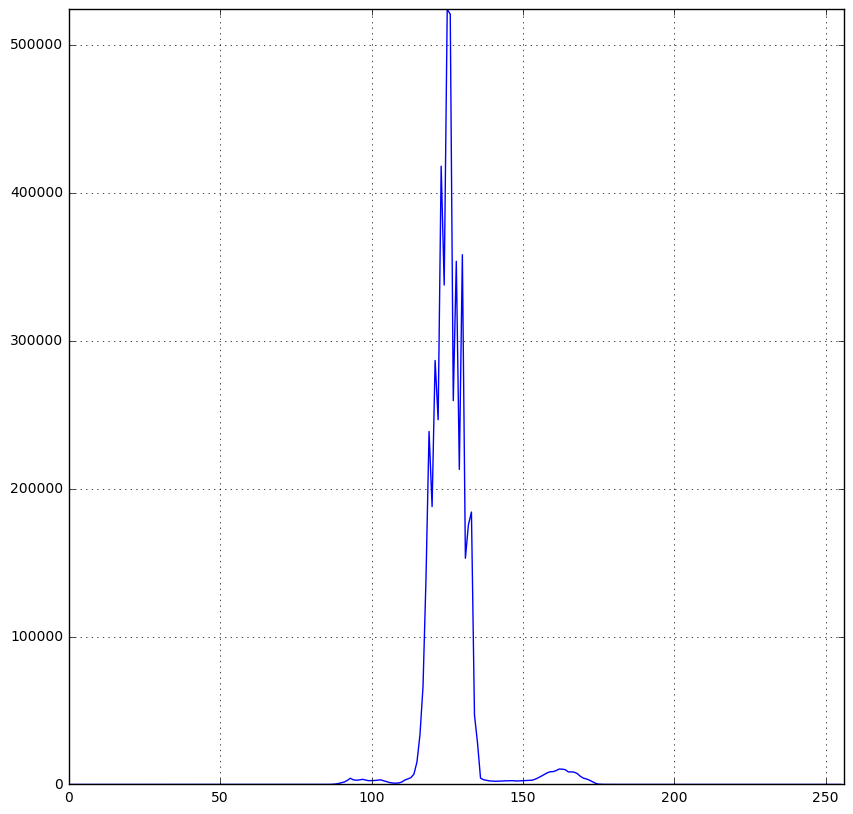

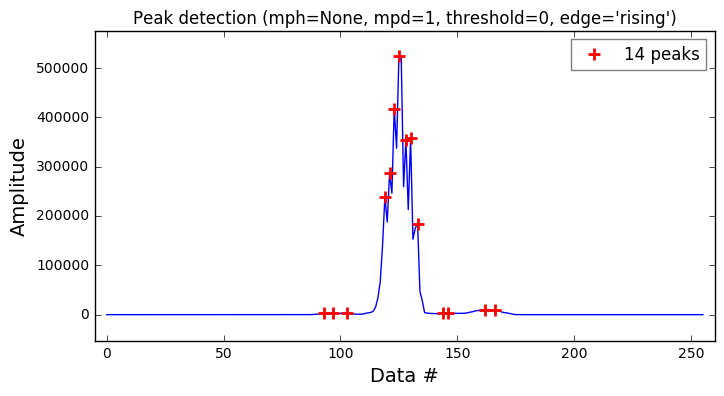

Threshold value = 145


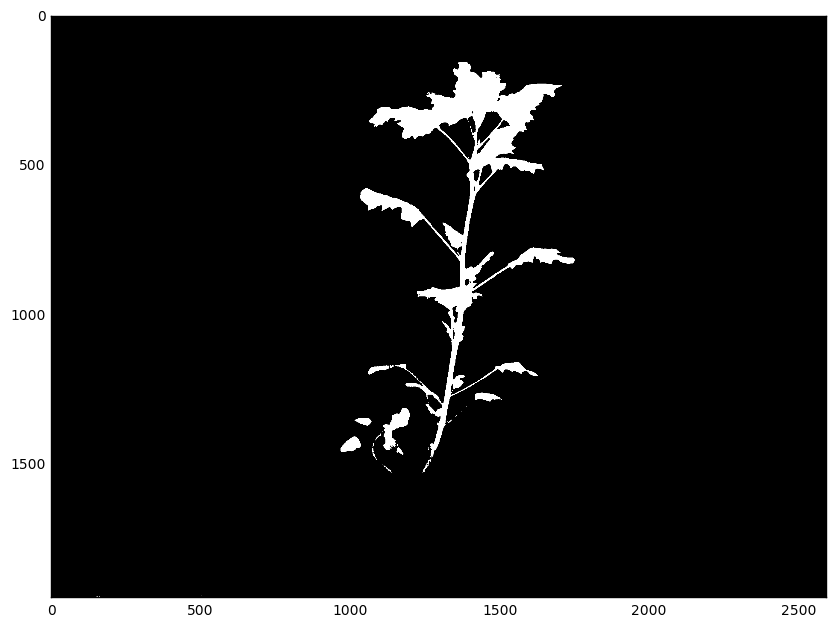

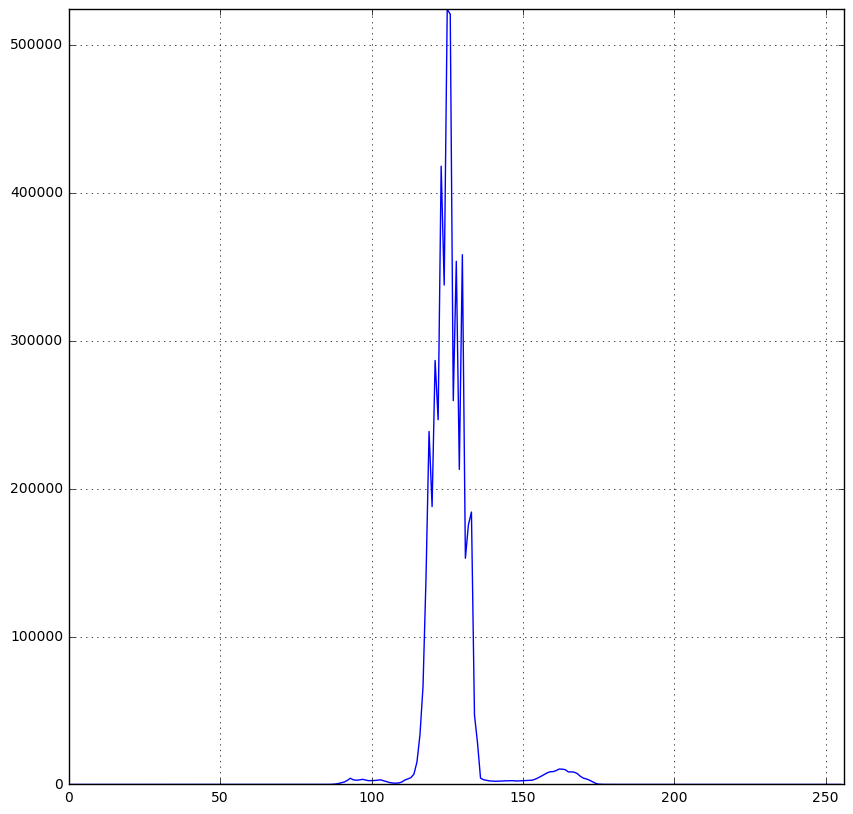

In [7]:
# Triangle Thresholded
device, tri_img_blur = pcv.triangle_auto_threshold(device, g_blur, 255, 'light', 20, debug)
device, tri_img_blur_cnt = pcv.triangle_auto_threshold(device, g_blur, 255, 'light', 20, debug)
# Thresholds based on a value 20. Modify the number 20 in both lines above to threshold plant from background.

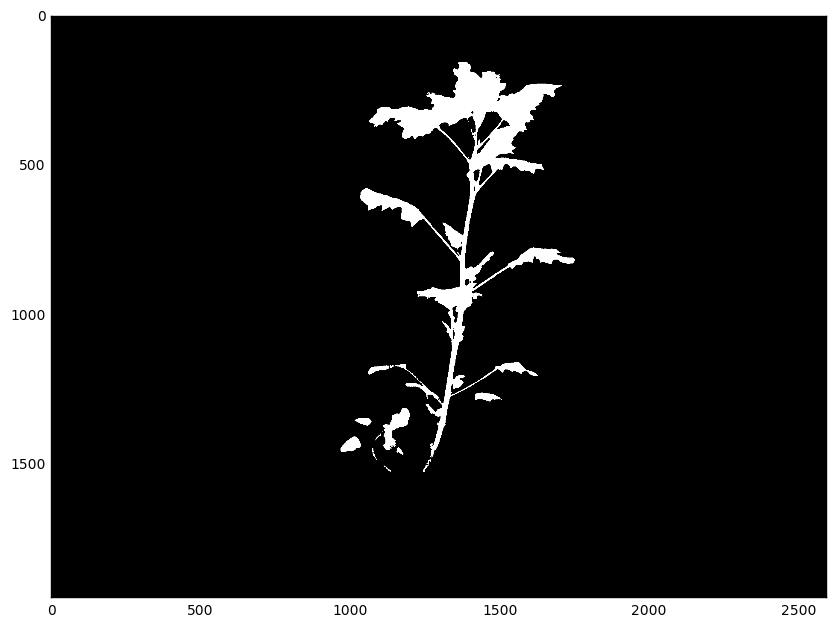

In [8]:
# Fill small objects
device, b_fill = pcv.fill(tri_img_blur, tri_img_blur_cnt, 50, device, debug)
# Modify the number 50 to what best fills holes in the plant (white) and background (black)

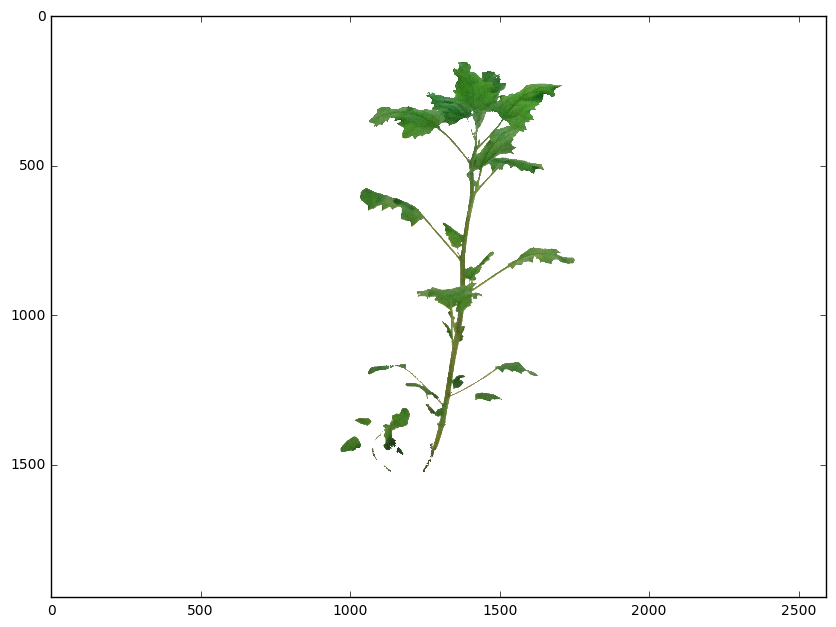

In [9]:
# Mask white-balanced image (here, based on blue channel)
device, masked = pcv.apply_mask(corr_img, b_fill, 'white', device, debug)

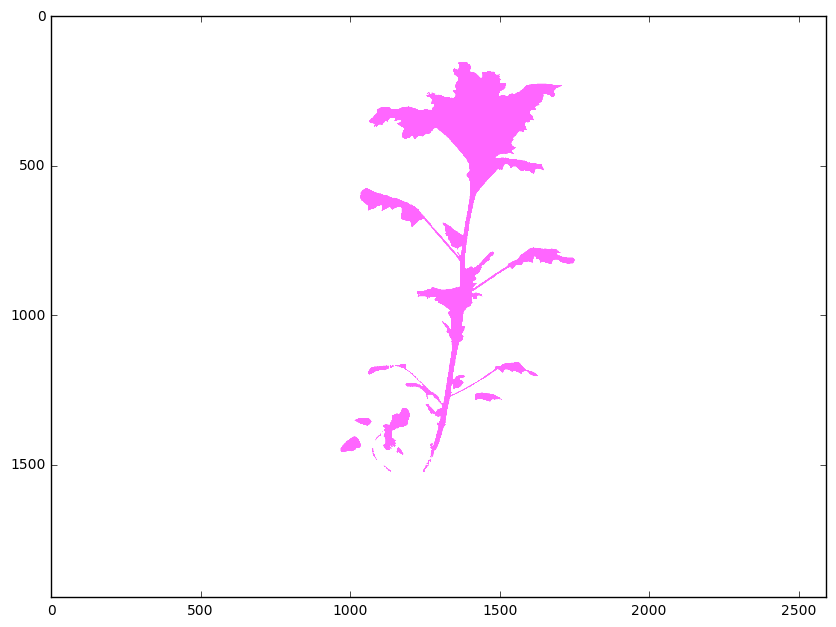

In [10]:
# Identify objects
device, id_objects, obj_hierarchy = pcv.find_objects(masked, b_fill, device, debug)

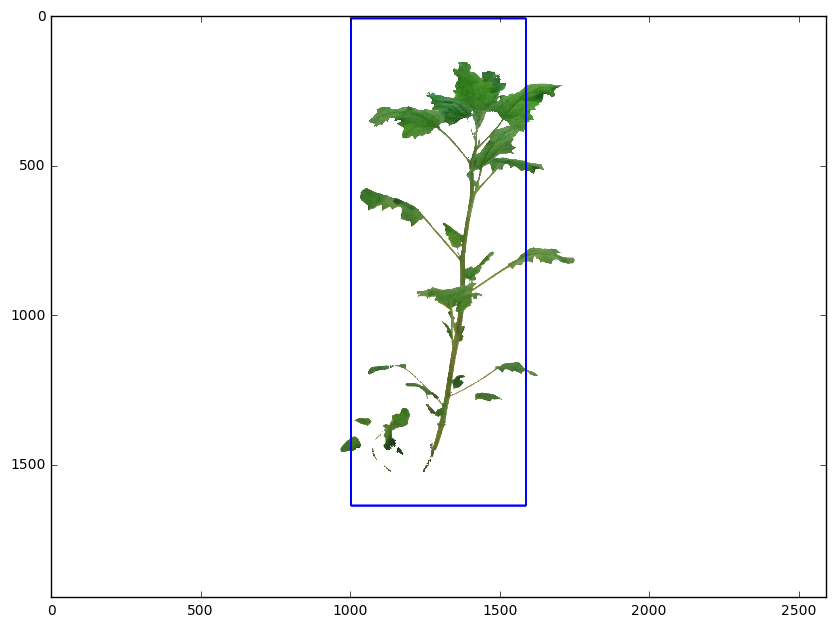

In [11]:
# Define region of interest
device, roi1, roi_hierarchy = pcv.define_roi(masked, 'rectangle', device, None, 'default', debug, True, 
                                             1000, 10, -1000, -300)
# Modify the 4 coordinates in parenthesis to frame the image area where the plant is.

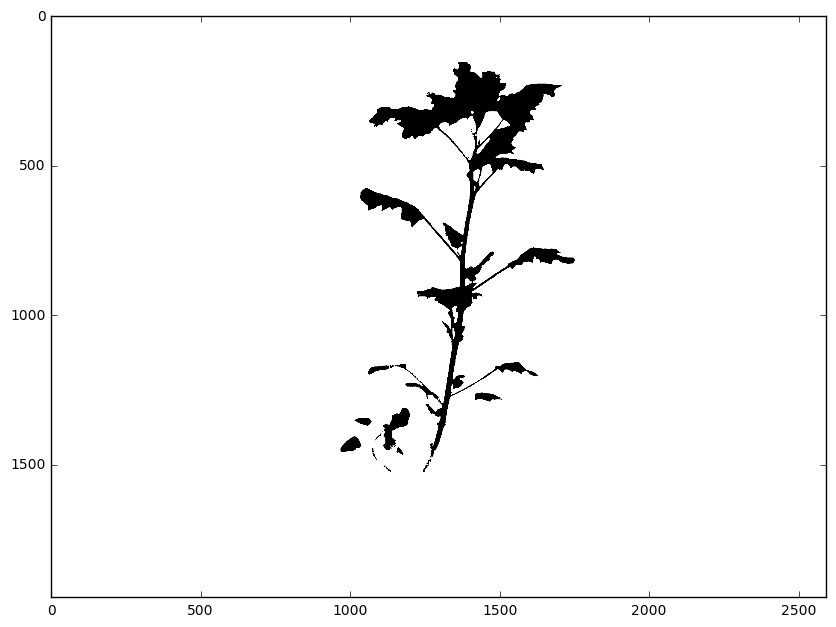

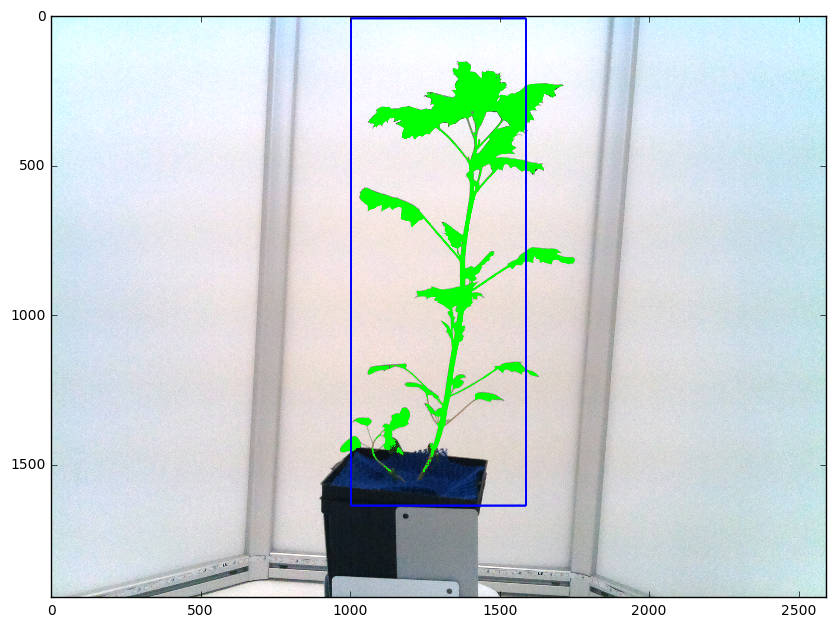

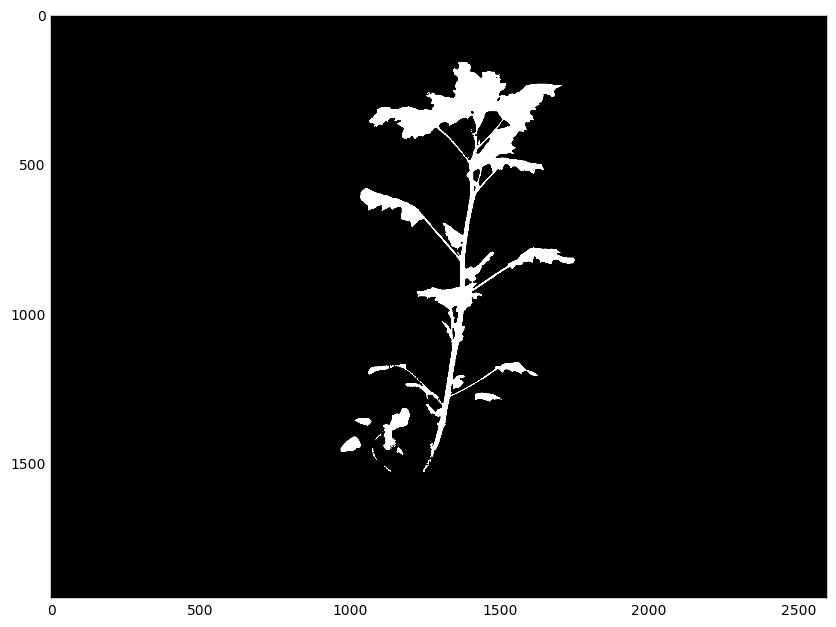

In [12]:
# Decide which objects to keep
device, roi_objects, hierarchy3, kept_mask, obj_area = pcv.roi_objects(corr_img, 'partial', roi1, roi_hierarchy, id_objects, obj_hierarchy, device, debug)

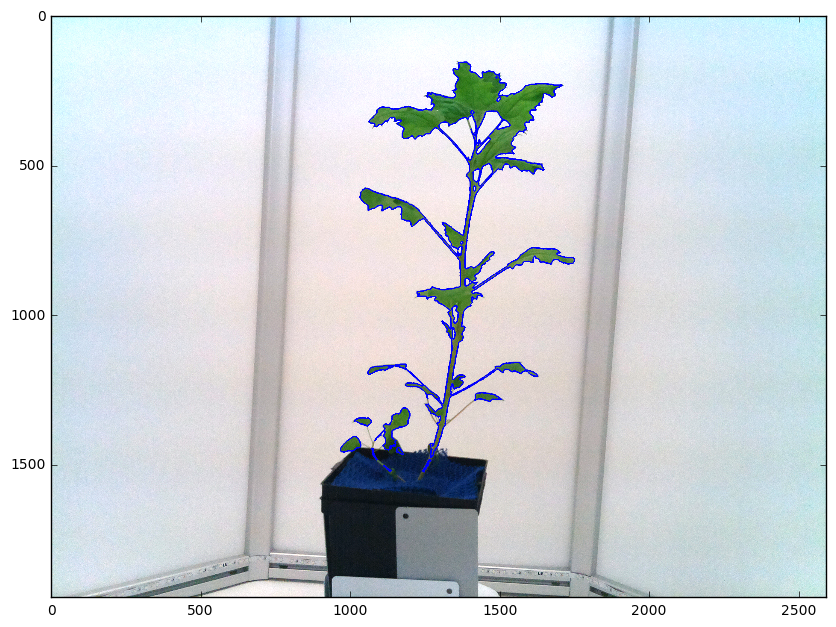

In [13]:
# Object combine kept objects
device, obj, mask = pcv.object_composition(corr_img, roi_objects, hierarchy3, device, debug)

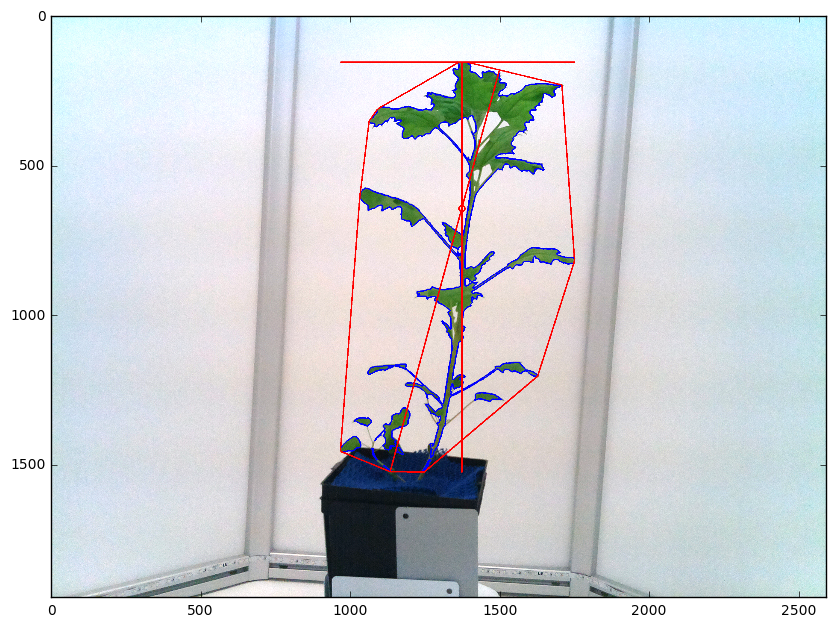

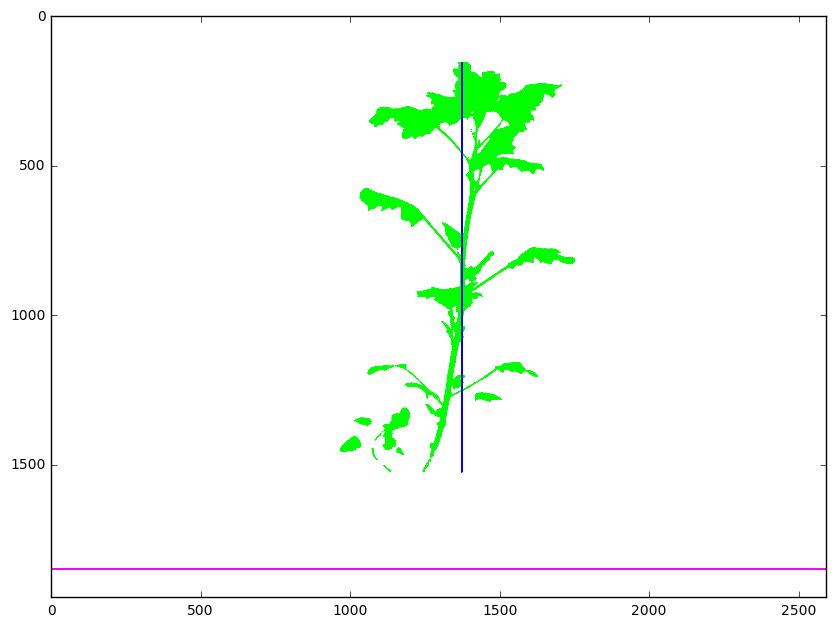

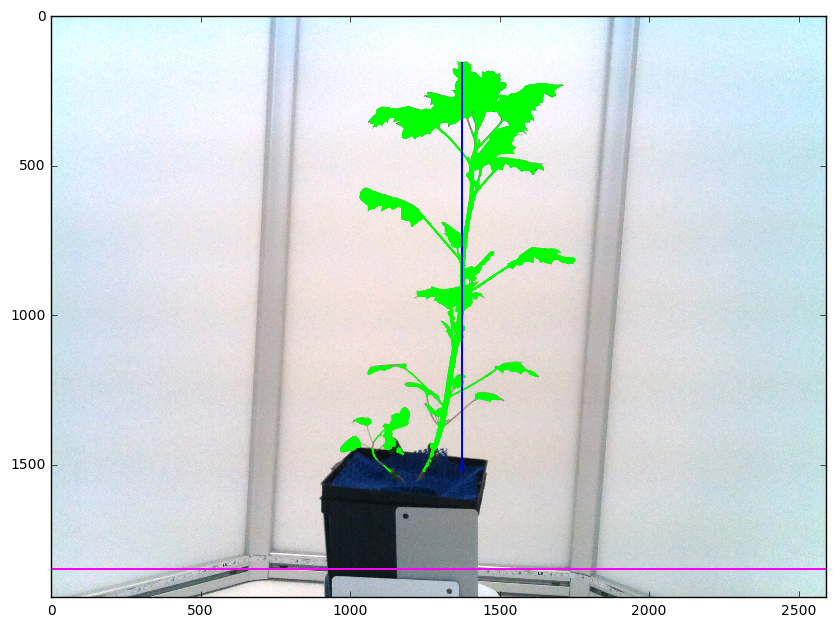

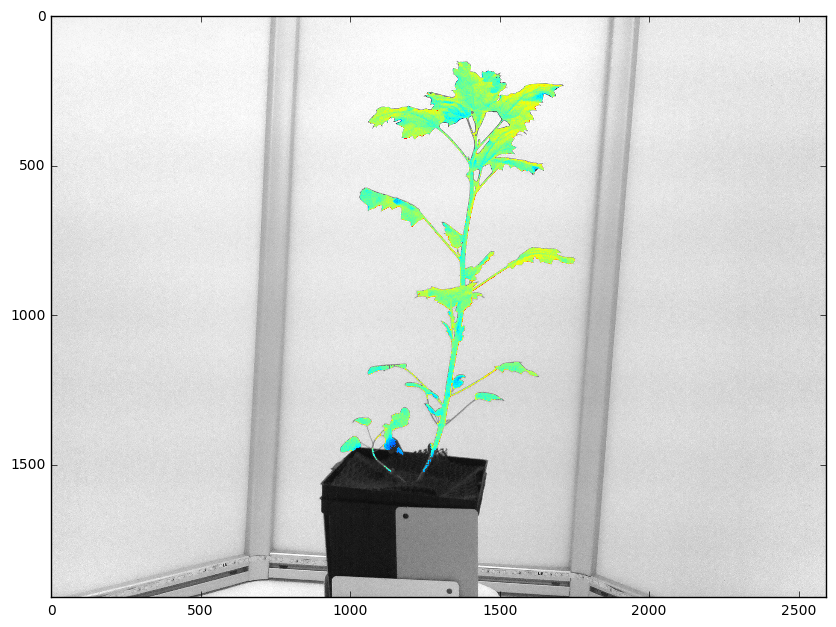

In [14]:
############### Analysis ################  

# Find shape properties, output shape image (optional)
device, shape_header, shape_data, shape_img = pcv.analyze_object(corr_img, corr_img, obj, mask, device, 'plot')

# Shape properties relative to user boundary line (optional)
device, boundary_header, boundary_data, boundary_img1 = pcv.analyze_bound(corr_img, corr_img, obj, mask, 90, device, 'plot')
# Sets the boundary line at 90. Modify the 90 in the parenthesis to move the boundary line.

# Determine color properties: Histograms, Color Slices and Pseudocolored Images, output color analyzed images (optional)
device, color_header, color_data, norm_slice = pcv.analyze_color(corr_img, corr_img, kept_mask, 256, device, 'plot', None,'v','img', 300)